In [1]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import os
import math


from PIL import Image
from tqdm import tqdm

import torch
from torch import nn
from torch.optim import Adam
from torch.utils.data import Dataset, DataLoader

from torch.distributions import Uniform

from torchvision.models import vgg19, VGG19_Weights
from torchvision.models.feature_extraction import create_feature_extractor
from torchvision import transforms as T
from torchvision.utils import make_grid



# Dataset

In [2]:
class TrainDataset(Dataset):
    def __init__(self, gt_images_dir: str, lr_images_dir: str = None, upscale_factor: int = 4, transform = None):
        super().__init__()
        
        self.gt_images_dir = gt_images_dir
        self.lr_images_dir = lr_images_dir
        self.upscale_factor = upscale_factor
        self.transform = transform
        
        self.gt_image_filenames = os.listdir(gt_images_dir)
        if self.lr_images_dir is None:
            self.lr_images_dir = self.gt_images_dir
            self.lr_image_filenames = self.gt_image_filenames
        else:
            self.lr_image_filenames = os.listdir(lr_images_dir)
            
        assert len(self.lr_image_filenames) == len(self.gt_image_filenames)
        
    def __len__(self):
        
        return len(self.lr_image_filenames)
    
    def __getitem__(self, idx):
        gt_image_path = os.path.join(self.gt_images_dir, self.gt_image_filenames[idx])
        
        lr_image_path = os.path.join(self.lr_images_dir, self.lr_image_filenames[idx])

        gt_image = Image.open(gt_image_path)
        lr_image = Image.open(lr_image_path)

        gt_image = gt_image.resize((128, 128))
        lr_image = lr_image.resize((32, 32))                 
        
        if self.transform:
            gt_image = self.transform(gt_image)
            lr_image = self.transform(lr_image)
            
        return lr_image, gt_image

# Model

In [3]:
def make_layer(k, channels):
    return nn.Sequential(
        nn.Conv2d(k * channels, channels, 3, 1, 1),
        nn.PReLU()
    )

class DenseBlock(nn.Module):
    def __init__(self, channels = 12):
        super(DenseBlock, self).__init__()
        
        layer_list = []
        
        for i in range(1, 16):
            layer_list.append(make_layer(i, channels))
            
        self.layer_list = nn.ModuleList(layer_list)
        
        self.conv_out = nn.Conv2d(16*channels, 16*channels, 3, 1, 1)
        
    def forward(self, x):
        '''x: batch, channels, height, width'''
        input_list = [x]
        for i, layer in enumerate(self.layer_list):
            x = layer(torch.cat(input_list, dim = 1))
            input_list.append(x) 
            
        x = self.conv_out(torch.cat(input_list, dim = 1))
        return x
    
class SubPixelConv(nn.Module):
    def __init__(self, channels = 64, upscale_factor = 2):
        super(SubPixelConv, self).__init__()

        self.upsample_block = nn.Sequential(
            nn.Conv2d(channels, channels * upscale_factor * upscale_factor, (3, 3), (1, 1), (1, 1)),
            nn.PixelShuffle(upscale_factor),
            nn.PReLU(),
        )
    
    def forward(self, x):
        x = self.upsample_block(x)
        
        return x

class SNConv2d(nn.Module):
    def __init__(
        self, 
        in_channels: int,
        out_channels: int,
        kernel_size,
        stride = 1,
        padding = 0,
        dilation = 1,
        groups = 1,
        bias = True,
        padding_mode: str = 'zeros',
        device = None,
        dtype = None
    ):
        super().__init__()
        
        self.snconv = nn.utils.spectral_norm(
            nn.Conv2d(
                in_channels,
                out_channels,
                kernel_size,
                stride,
                padding,
                dilation,
                groups,
                bias,
                padding_mode,
                device,
                dtype
            )
        )
    
    def forward(self, x):
        
        return self.snconv(x)

class SNConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        
        self.block1 = nn.Sequential(
                SNConv2d(in_channels, in_channels, (3, 3), (2, 2), (1, 1), bias=False),
                nn.BatchNorm2d(in_channels),
                nn.LeakyReLU(0.2, True)
            ) 
        
        self.block2 = nn.Sequential(
                SNConv2d(in_channels, out_channels, (3, 3), (1, 1), (1, 1), bias=False),
                nn.BatchNorm2d(out_channels),
                nn.LeakyReLU(0.2, True)
            ) 

    def forward(self, x):
        x = self.block1(x)
        x = self.block2(x)
        
        return x

In [4]:
class Discriminator(nn.Module):
    def __init__(self, in_channels= 3, channels = 64):
        super().__init__()
        
        # batch, in_channels, 128, 128
        self.conv1 = nn.Sequential(
                nn.Conv2d(in_channels, channels, 3, 2, 1, bias = False),
                nn.LeakyReLU(0.2, True)
            )
        
        # batch, channels, 64, 64
        self.block1 = SNConvBlock(channels, 2*channels)
        
        # batch, 2*channels, 32, 32
        self.block2 = SNConvBlock(2*channels, 4*channels)
        
        # batch, 4*channels, 16, 16
        self.block3 = SNConvBlock(4*channels, 8*channels)
        
        # batch, 8*channels, 8, 8
        self.fully_connected = nn.Sequential(
            nn.Linear(8*channels*8*8, 1024),
            nn.LeakyReLU(0.2, True),
            nn.Linear(1024, 1),
            nn.Sigmoid()
        )
        
    def forward(self, x) -> torch.Tensor:
        '''x: batch, channels, height, width'''

        batch_size = x.shape[0]

        x = self.conv1(x)
        
        x = self.block1(x)
        
        x = self.block2(x)
        
        x = self.block3(x)
        
        x = x.view(batch_size, -1)
        
        x = self.fully_connected(x)
        
        return x

In [5]:
class Generator(nn.Module):
    def __init__(self, in_channels = 3, out_channels = 3, channels = 64, upscale = 4):
        super(Generator, self).__init__()
        
        if not math.log2(upscale) == int(math.log2(upscale)):
            raise ValueError(f"Upscale factor `{upscale}` is not support.")
        
        self.conv = nn.Sequential(
                nn.Conv2d(in_channels, 64, 9, 1, 4),
                nn.PReLU()
            )

        self.dense_block = DenseBlock(channels = 64)
    
        self.bottle_neck = nn.Conv2d(64 * 16, channels, kernel_size = (1, 1), stride = 1)
        
        self.subpixel_conv = nn.Sequential(
            SubPixelConv(channels, upscale_factor = upscale // 2),
            SubPixelConv(channels, upscale_factor = upscale // 2)
        )
        
        self.out = nn.Conv2d(channels, out_channels, (9, 9), (1, 1), (4, 4))
        
    def forward(self, x) -> torch.Tensor:
        x = self.conv(x)
        
        x = self.dense_block(x)
        
        x = self.bottle_neck(x)
        
        x = self.subpixel_conv(x)
        
        x = self.out(x)
        
        return x

In [7]:
model = Generator(3, 3, 64, 4)
x = torch.rand(2, 3, 32, 32)
y = model(x)
print(y.shape)

torch.Size([2, 3, 128, 128])


# Loss

In [8]:
class PerceptualLoss(nn.Module):
    def __init__(self,
        features_nodes = ["features.24"],
        vgg_pretrained =  True,
        device = 'cpu'
    ):
        super(PerceptualLoss, self).__init__()
        
        if isinstance(device, str):
            if (device == 'cuda' or device == 'gpu') and torch.cuda.is_available():
                device = torch.device(device)
            else:
                device = torch.device('cpu')

        
        if vgg_pretrained:
            self.model = vgg19(weights = VGG19_Weights.IMAGENET1K_V1).to(device)
        else:
            self.model = vgg19().to(device)
            
        self.features_nodes = features_nodes
        
        self.feature_extractor = create_feature_extractor(self.model, return_nodes = features_nodes)
        
        self.feature_extractor.eval()
        
        self.euclide_loss = nn.MSELoss()
        
    def transform(self, x: torch.Tensor):
        '''x: batch, channels, height, width'''
        return T.Compose(
            [
                T.Normalize(mean = [0.485, 0.456, 0.406], std = [0.229, 0.224, 0.225])
            ]
        )(x)
        
    def forward(self, sr_tensor: torch.Tensor, gt_tensor: torch.Tensor):
        assert sr_tensor.size() == gt_tensor.size(), "Two tensor must have the same size"
        
        device = sr_tensor.device
        
        sr_tensor = self.transform(sr_tensor)
        gt_tensor = self.transform(gt_tensor)
        
        sr_features = self.feature_extractor(sr_tensor)
        gt_features = self.feature_extractor(gt_tensor)
        
        losses = []
        
        for layer in self.features_nodes:
            losses.append(
                self.euclide_loss(sr_features[layer], gt_features[layer])
            )
        
        if len(losses) == 1:
            return losses[0].to(device)
        else:
            return torch.Tensor(losses).to(device)
        
class PixelWiseLoss(nn.Module):
    def __init__(self):
        super(PixelWiseLoss, self).__init__()
        
        self.loss_func = nn.MSELoss()
        
    def forward(self, in_tensor, target_tensor):
        
        loss = self.loss_func(in_tensor, target_tensor)
        
        return loss
    
class AdversarialLoss(nn.Module):
    def __init__(self):
        super(AdversarialLoss, self).__init__()
        
        self.loss_func = nn.BCELoss()
        
    def forward(self, in_tensor, target_tensor):
        loss = self.loss_func(in_tensor, target_tensor)
        
        return loss

# Dataset and dataloader

In [9]:
batch_size = 64
num_workers = os.cpu_count()

transform = T.Compose(
    [
#         T.RandomHorizontalFlip(),
        T.ToTensor()
    ]
)

root_dir = "/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba"
train_dataset = TrainDataset(root_dir, transform = transform)
train_set, val_set = torch.utils.data.random_split(train_dataset, [0.9, 0.1])
train_loader = DataLoader(train_set, batch_size = batch_size, shuffle = True, num_workers = num_workers)
val_loader = DataLoader(val_set, batch_size = 32, num_workers = num_workers)


In [11]:
device = torch.device("cuda" if torch.cuda.is_available() else 'cpu')

dis_model = Discriminator().to(device)
gen_model = Generator().to(device)

dis_optim = Adam(dis_model.parameters(), lr = 0.0001, betas = [0.9, 0.999], eps = 0.0001)
gen_optim = Adam(gen_model.parameters(), lr = 0.0001, betas = [0.9, 0.999], eps = 0.0001)

adversarial_criterion = AdversarialLoss()
pixel_criterion = PixelWiseLoss()
content_criterion = PerceptualLoss(device = device)


In [12]:
epochs = 10
adversarial_weight = 0.001
steps_per_epoch = 500

img_list = []

for lr_images, gt_images in val_loader:
    fixed_input = lr_images
    fixed_output = gt_images
    break

num_steps = len(train_loader)
iterator = iter(train_loader)
count_steps = 1

Epoch 1/10: 100%|█████████████████████████████████████████████████| 500/500 [05:07<00:00,  1.62it/s]


Epoch: 1/10: D Loss:  0.2439, G loss:  7.0605


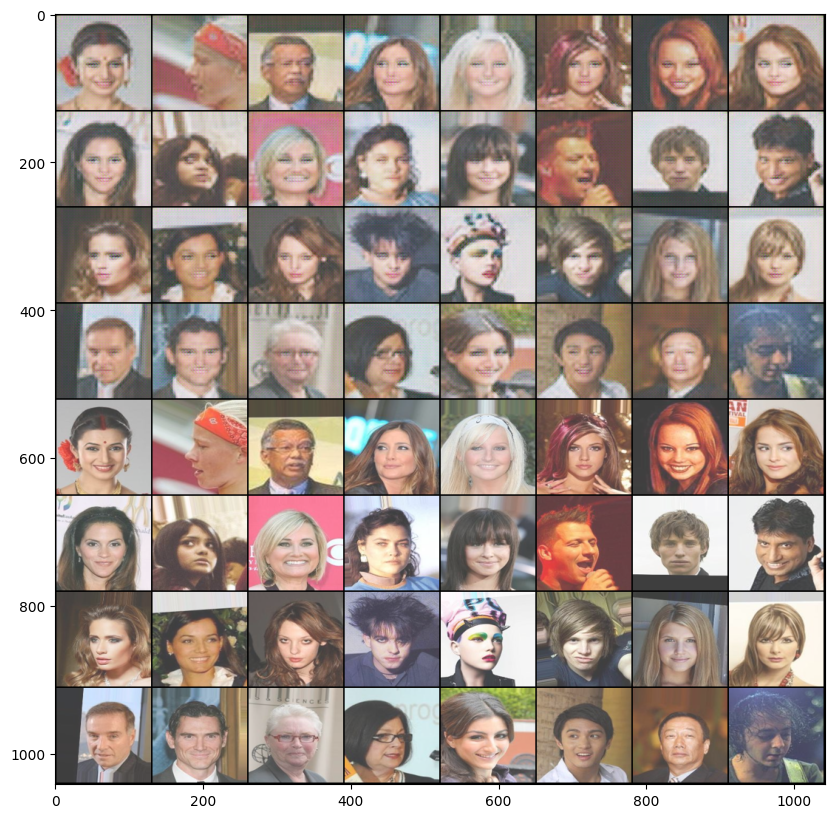

Epoch 2/10: 100%|█████████████████████████████████████████████████| 500/500 [05:00<00:00,  1.66it/s]


Epoch: 2/10: D Loss:  0.2160, G loss:  4.8043


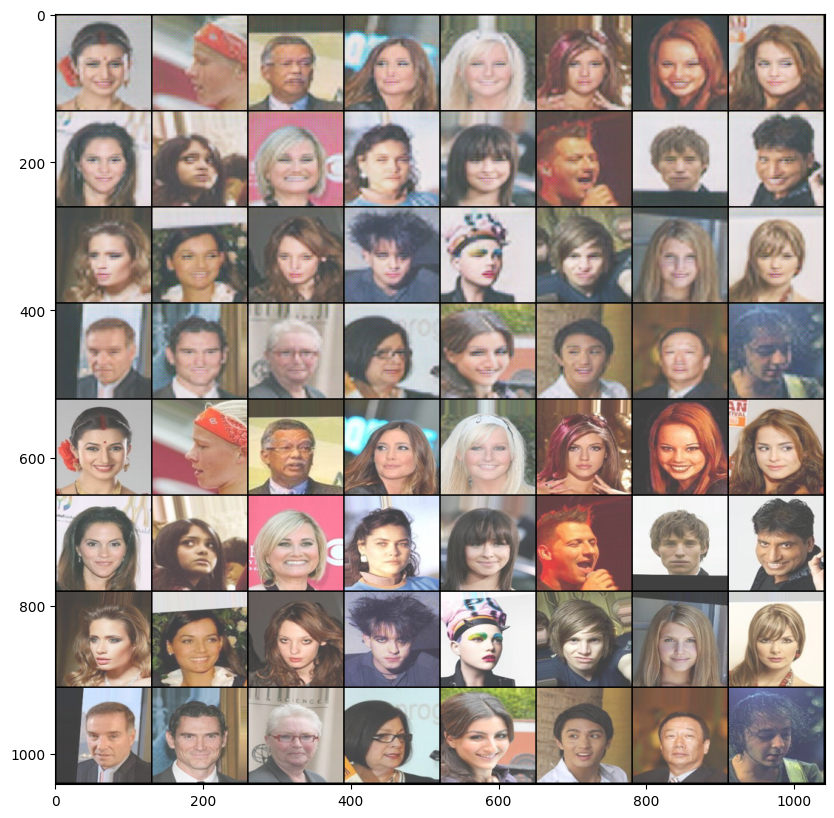

Epoch 3/10: 100%|█████████████████████████████████████████████████| 500/500 [05:00<00:00,  1.66it/s]


Epoch: 3/10: D Loss:  0.2152, G loss:  4.3943


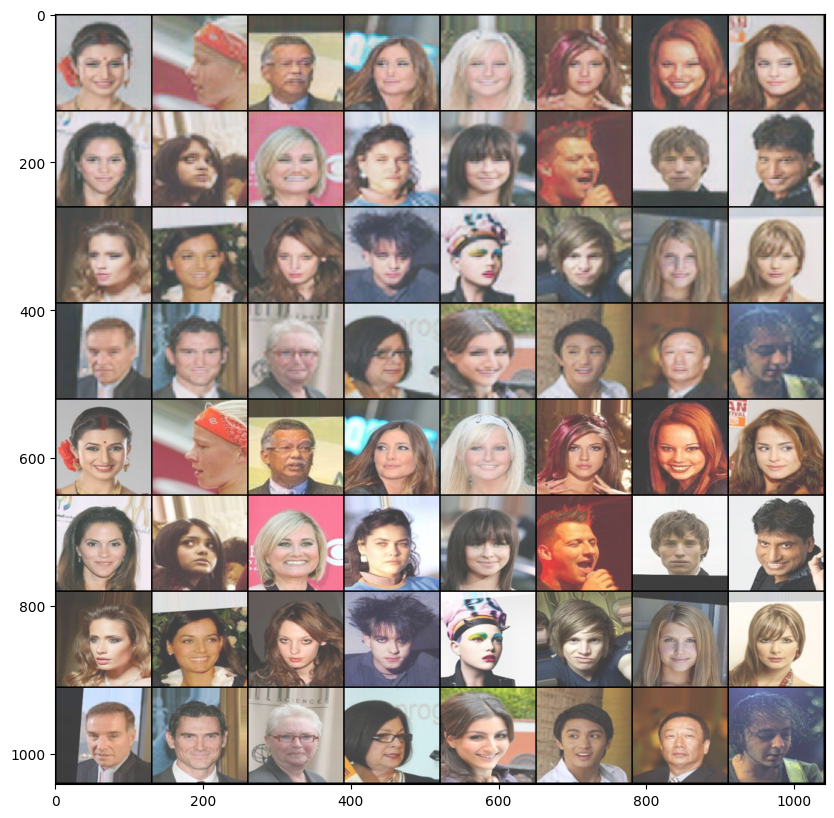

Epoch 4/10: 100%|█████████████████████████████████████████████████| 500/500 [05:00<00:00,  1.66it/s]


Epoch: 4/10: D Loss:  0.2156, G loss:  4.1558


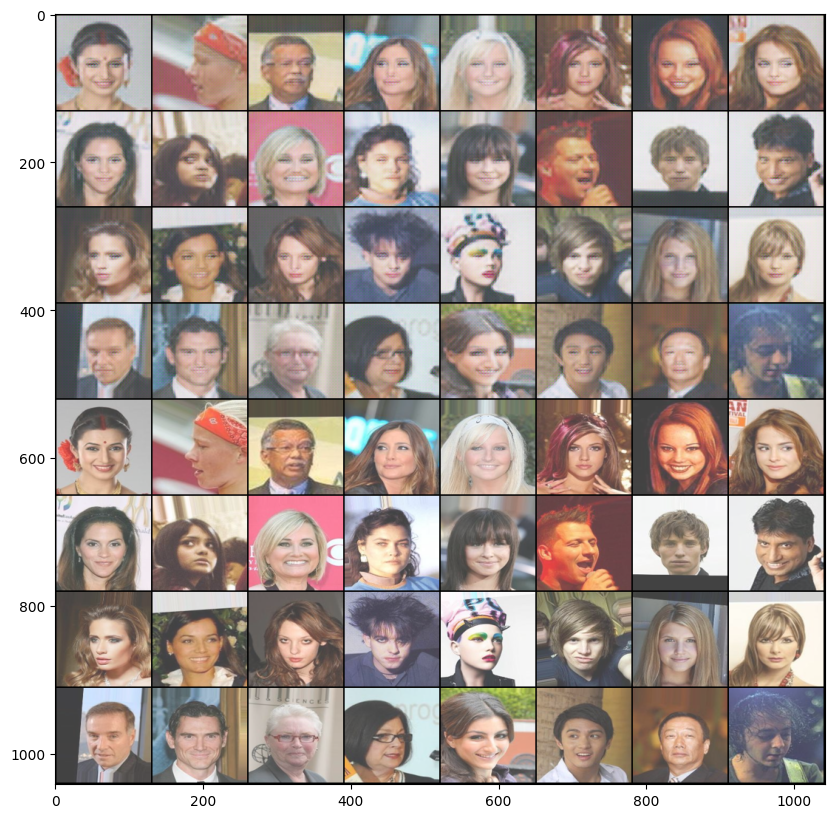

Epoch 5/10: 100%|█████████████████████████████████████████████████| 500/500 [05:00<00:00,  1.66it/s]


Epoch: 5/10: D Loss:  0.2154, G loss:  3.9983


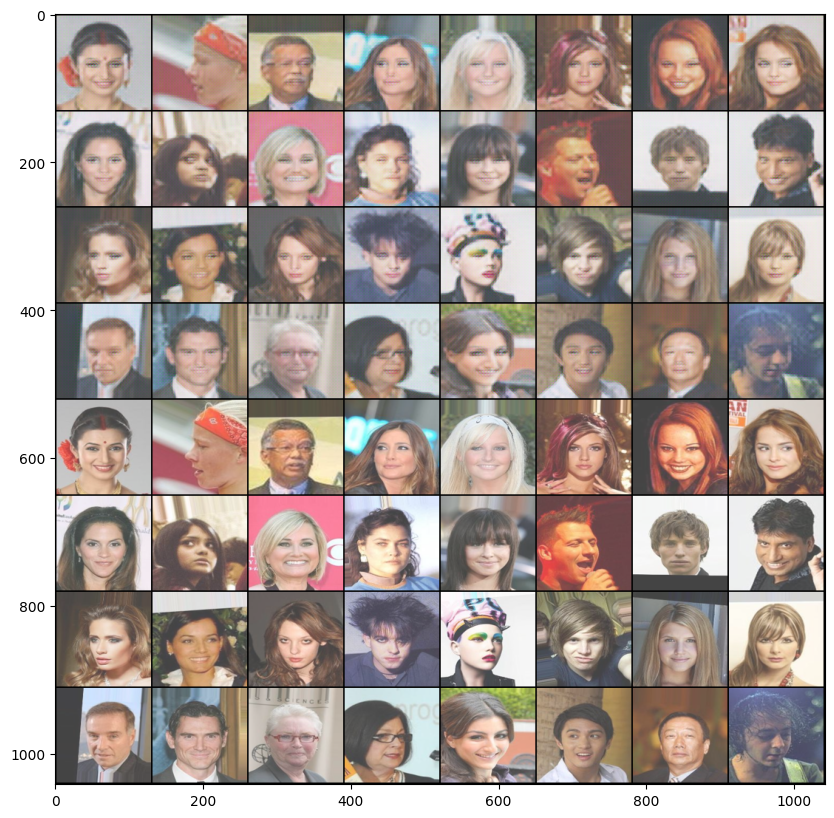

Epoch 6/10: 100%|█████████████████████████████████████████████████| 500/500 [05:01<00:00,  1.66it/s]


Epoch: 6/10: D Loss:  0.2152, G loss:  3.8626


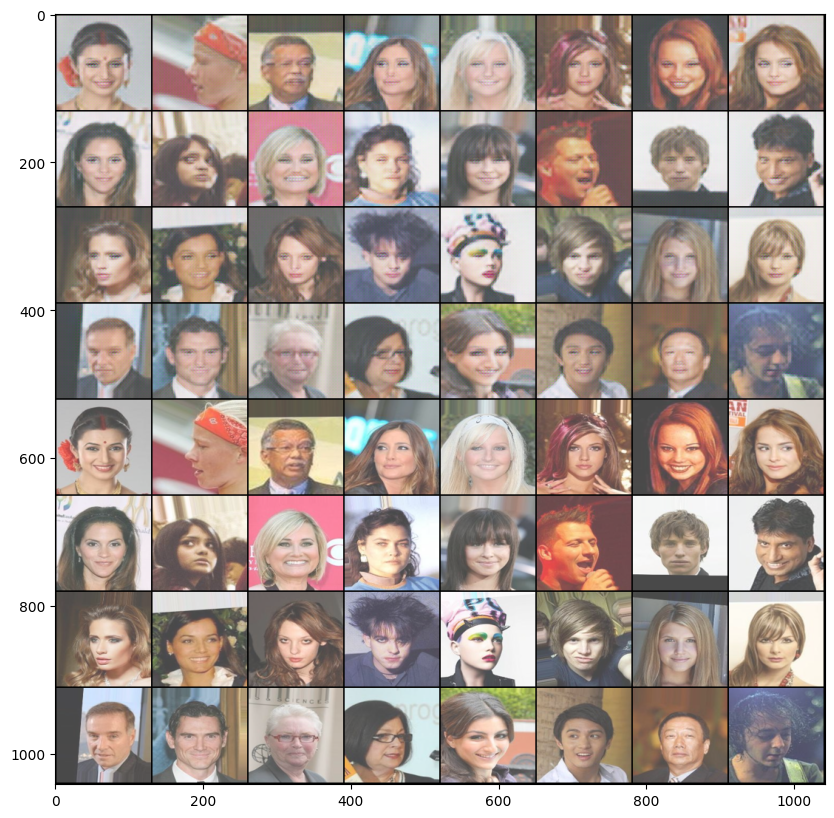

Epoch 7/10: 100%|█████████████████████████████████████████████████| 500/500 [05:01<00:00,  1.66it/s]


Epoch: 7/10: D Loss:  0.2221, G loss:  3.7594


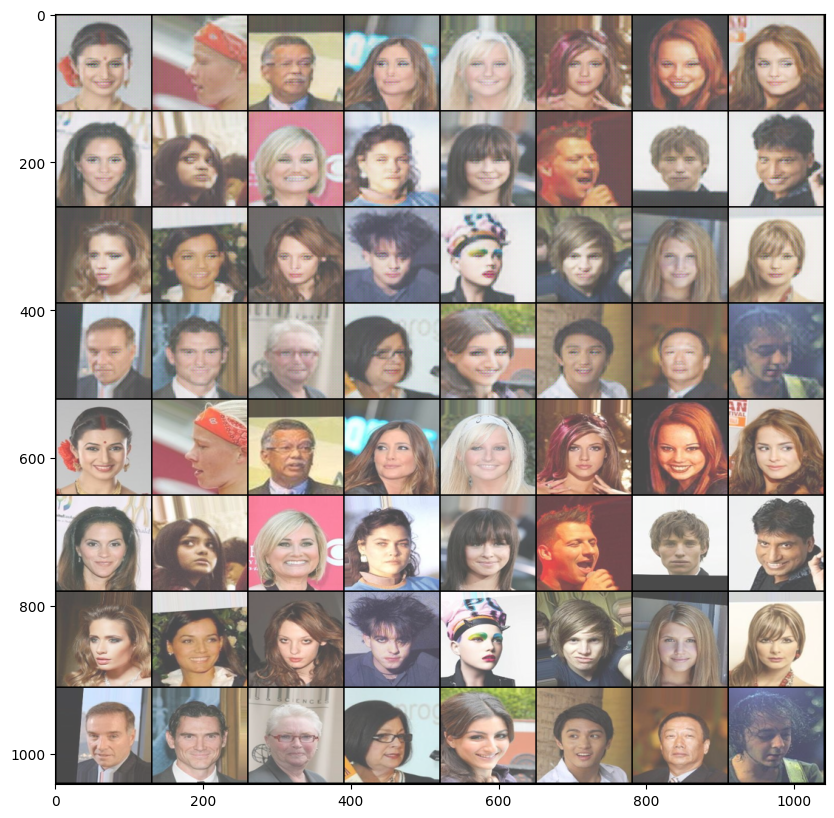

Epoch 8/10: 100%|█████████████████████████████████████████████████| 500/500 [05:01<00:00,  1.66it/s]


Epoch: 8/10: D Loss:  0.2156, G loss:  3.6791


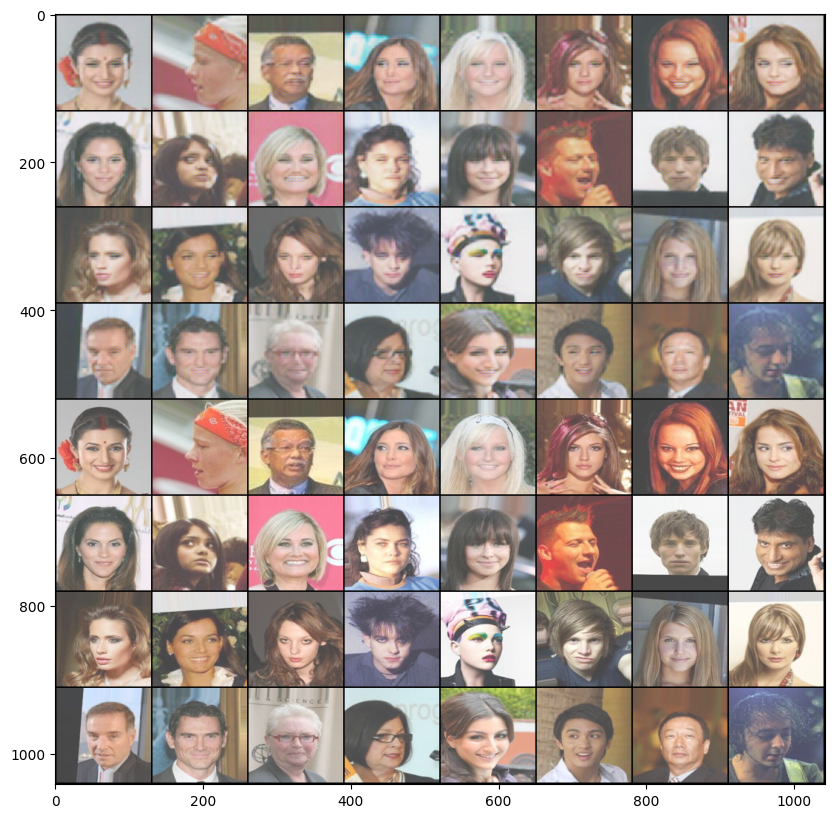

Epoch 9/10: 100%|█████████████████████████████████████████████████| 500/500 [05:01<00:00,  1.66it/s]


Epoch: 9/10: D Loss:  0.2162, G loss:  3.5987


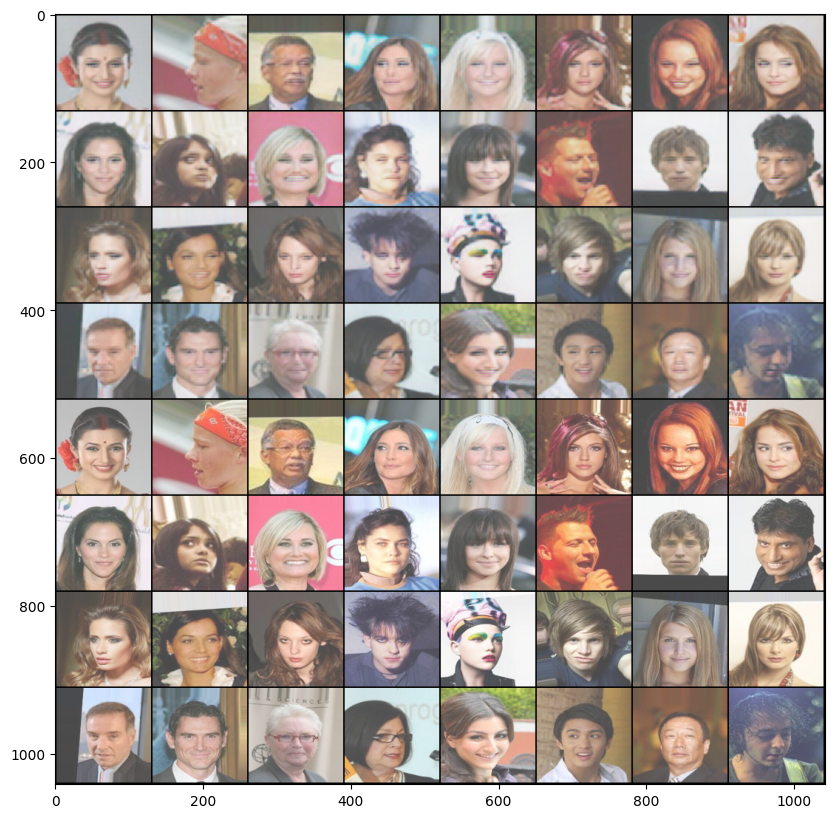

Epoch 10/10: 100%|████████████████████████████████████████████████| 500/500 [05:01<00:00,  1.66it/s]


Epoch: 10/10: D Loss:  0.2149, G loss:  3.5178


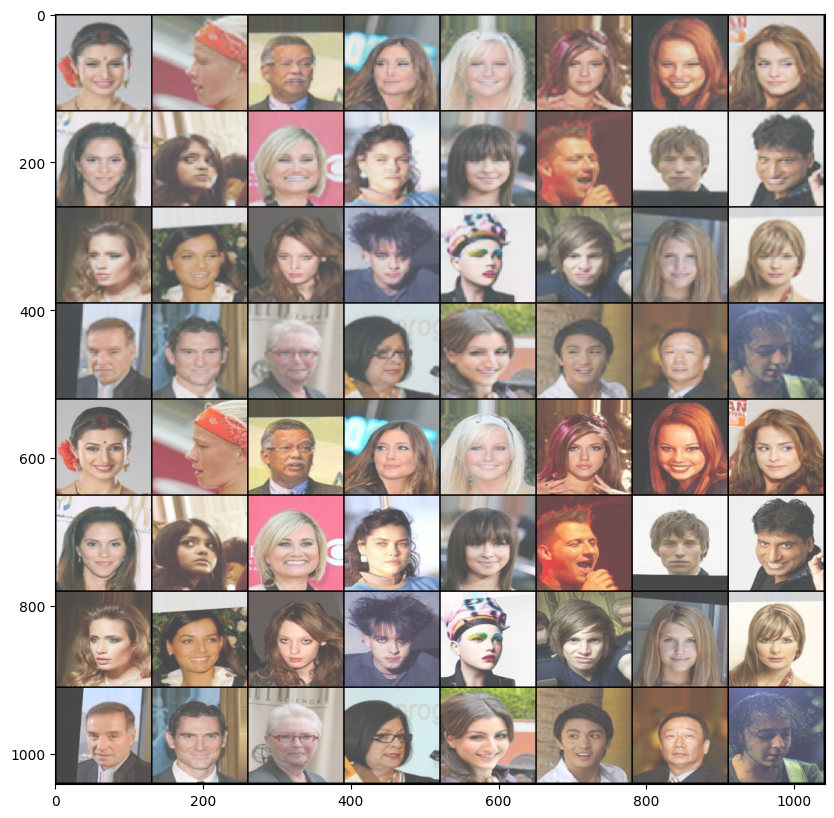

In [13]:
for epoch in range(1, epochs + 1):
    
    gen_model.train()
    dis_model.train()
    
    total_d_loss = 0
    total_g_loss = 0
    for step in tqdm(range(steps_per_epoch), desc = f'Epoch {epoch}/{epochs}: ', ncols = 100):
        lr_images, gt_images = next(iterator)
        batch_size = lr_images.shape[0]
        lr_images = lr_images.to(device)
        gt_images = gt_images.to(device)
          
        # Train generator    
        sr_images = gen_model(lr_images)
        sr_out = dis_model(sr_images.detach())
                
        real_label = Uniform(0.96, 1.0).sample([batch_size, 1]).to(device)
#         real_label = torch.ones(batch_size, 1).to(device)
        pixel_loss = pixel_criterion(sr_images, gt_images)
        content_loss = content_criterion(sr_images, gt_images)
        adversarial_loss = adversarial_criterion(sr_out, real_label)
        
#         g_loss = pixel_loss + content_loss + adversarial_weight*adversarial_loss
        g_loss = content_loss + adversarial_weight*torch.sum(-torch.log(sr_out))
        
        gen_optim.zero_grad()
        g_loss.backward()
        gen_optim.step()
        
        ## Train Discriminator
        gt_out = dis_model(gt_images.detach())
        d_gt_loss = adversarial_criterion(gt_out, real_label)
        
        dis_optim.zero_grad()
        d_gt_loss.backward()
        dis_optim.step()
        
        sr_out = dis_model(sr_images.detach())
        fake_label = Uniform(0., 0.05).sample([batch_size, 1]).to(device)
#         fake_label = torch.zeros(batch_size, 1).to(device)

        d_sr_loss = adversarial_criterion(sr_out, fake_label)
        
        dis_optim.zero_grad()
        d_sr_loss.backward()
        dis_optim.step()
        
        d_loss = d_gt_loss + d_sr_loss
        
        total_d_loss += d_loss
        total_g_loss += g_loss
        
        if count_steps == num_steps:
            iterator = iter(train_loader)
            count_steps = 0
        count_steps += 1

    average_d_loss = total_d_loss.item()/steps_per_epoch
    average_g_loss = total_g_loss.item()/steps_per_epoch
    
    print(f'Epoch: {epoch}/{epochs}: D Loss: {average_d_loss : .4f}, G loss: {average_g_loss : .4f}')

    if epoch % 1 == 0:
        with torch.no_grad():
            sr_images = gen_model(fixed_input.to(device)).detach().cpu()
        results = torch.cat([sr_images, fixed_output], dim = 0)
        results = make_grid(results, padding=2, normalize=True)
        img_list.append(results)
        plt.figure(figsize=(10,10))
        plt.imshow(img_list[-1].permute(1,2,0))
        plt.show()


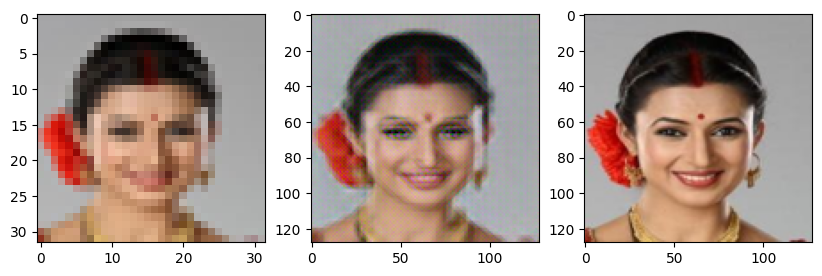

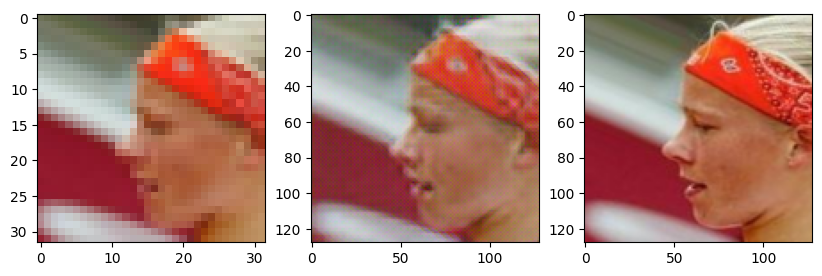

In [14]:
plt.figure(figsize = (10, 8))
plt.subplot(2,3,1)
plt.imshow(fixed_input[0].permute(1, 2, 0))
plt.subplot(2,3,2)
plt.imshow(sr_images[0].permute(1, 2, 0))
plt.subplot(2,3,3)
plt.imshow(fixed_output[0].permute(1, 2, 0))
plt.figure(figsize = (10, 8))
plt.subplot(2,3,1)
plt.imshow(fixed_input[1].permute(1, 2, 0))
plt.subplot(2,3,2)
plt.imshow(sr_images[1].permute(1, 2, 0))
plt.subplot(2,3,3)
plt.imshow(fixed_output[1].permute(1, 2, 0))